In [3]:
using
    QuantumStates,
    OpticalBlochEquations,
    DifferentialEquations,
    UnitsToValue,
    LinearAlgebra,
    Printf,
    Plots,
    # DiffEqNoiseProcess,
    Random,
    StatsBase
;

import MutableNamedTuples: MutableNamedTuple
import StructArrays: StructArray, StructVector
import StaticArrays: @SVector, SVector
import LinearAlgebra: norm, ⋅, adjoint!, diag
import LoopVectorization: @turbo
using BenchmarkTools
using Parameters

import ProgressMeter: Progress, next!

const λ = 626e-9
const Γ = 2π* 6.4e6
const m = @with_unit 57 "u"
const k = 2π / λ
_μB = (μ_B / h) * 1e-4;

In [4]:
import QuantumStates.TDM

function TDM(state::AngularMomentumState_Labelled, state′::AngularMomentumState_Labelled, p::Int64)
    L,  N,  M  = unpack(state)
    L′, N′, M′ = unpack(state′)
    if L′ <= L
        return 0.0
    else
        return (
            (-1)^p * (-1)^(N - M) * wigner3j(N, 1, N′, -M, -p, M′) * sqrt(2N′ + 1)
        )
    end
end

TDM (generic function with 13 methods)

# Stochastic Schrodinger Eqn for a two-level system

Spontaneous events are handled by randomly sampling in a uniform distribution every dT (fixed interval), then comparing the value to the scatter rate = (average excited state population) $\times \Gamma$.

Taking the average excited population in time interval dT instead of taking the instantaneous excited state population to avoid biases which occur when dT is (close to) an integer multiple of the system period.

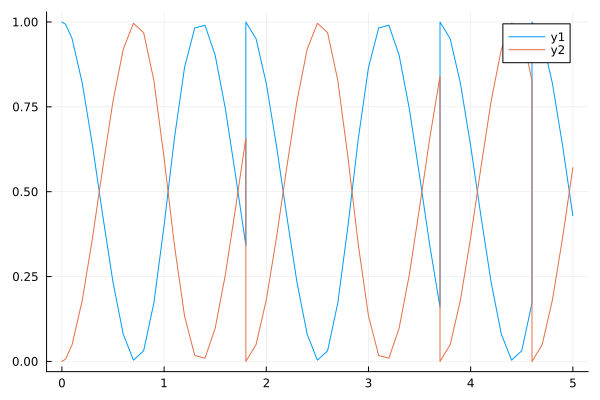

In [8]:
function v!(dv, v, p, τ)
    v[1:2] ./= sqrt(sum(norm.(v[1:2]).^2))

   dv[1:2] .= -im*H*v[1:2]
    dv[3] = norm(v[2])^2

    return nothing
end


function two_level_collapse!(integrator)
   rn = rand()
    if rn < 1 * dT * norm(integrator.u[3]/dT)
        integrator.u[1] = 1
        integrator.u[2] = 0
    end
    integrator.u[3] = 0
end

H = zeros(ComplexF64, 2,2);
H[1,2] = 2.3
H[2,1] = 2.3
H[2,2] = -im*0.5

v0 = zeros(ComplexF64, 3,1)
v0[1] = 1
dT = 0.1
extra_p = [0.0]
prob = ODEProblem(v!, v0, (0.0, 5.0), extra_p);


cb = PeriodicCallback(two_level_collapse!, dT)
sol = solve(prob, alg=DP5(), reltol=1e-5, abstol = 1e-5, save_on=true, callback = cb);

plot(sol.t, (norm.([x[1] for x in sol.u])).^2)
plot!(sol.t, (norm.([x[2] for x in sol.u])).^2)

# Stochastic SE for time-dependent Hamiltonians

In [5]:
struct Jump
    s ::Int64
    s′::Int64
    q::Int64
    r ::ComplexF64
end

function schrodinger_stochastic(
    particle, states, fields, d, ψ₀, mass; 
    extra_p=nothing, λ=1.0, Γ=2π, update_H=update_H)
    """
    extra_p should contain n_excited
    """

    n_states = length(states)
    n_fields = length(fields)

    states = StructArray(states)
    if n_fields > 0
        fields = StructArray(fields)
    end
    fields = StructArray(fields)

    k = 2π / λ
    
    # time unit: 1/Γ
    for i ∈ eachindex(fields)
        fields.ω[i] /= Γ
    end
    for i ∈ eachindex(states)
        states.E[i] *= 2π
        states.E[i] /= Γ
    end

    r0 = particle.r0
    r = particle.r
    v = particle.v

    type_complex = ComplexF64

    H = StructArray( zeros(type_complex, n_states, n_states) )
    H₀ = deepcopy(H)

    ω = [s.E for s in states]
    eiωt = StructArray(zeros(type_complex, n_states))

    # Compute cartesian indices to indicate nonzero transition dipole moments in `d`
    # Indices below the diagonal of the Hamiltonian are removed, since those are defined via taking the conjugate
    d_nnz_m = [cart_idx for cart_idx ∈ findall(d[:,:,1] .!= 0) if cart_idx[2] >= cart_idx[1]]
    d_nnz_0 = [cart_idx for cart_idx ∈ findall(d[:,:,2] .!= 0) if cart_idx[2] >= cart_idx[1]]
    d_nnz_p = [cart_idx for cart_idx ∈ findall(d[:,:,3] .!= 0) if cart_idx[2] >= cart_idx[1]]
    d_nnz = [d_nnz_m, d_nnz_0, d_nnz_p]

    Js = Array{Jump}(undef, 0)
    ds = [Complex{Float64}[], Complex{Float64}[], Complex{Float64}[]]
    ds_state1 = [Int64[], Int64[], Int64[]]
    ds_state2 = [Int64[], Int64[], Int64[]]
    for s′ in eachindex(states), s in s′:n_states, q in qs
        dme = d[s′, s, q+2]
        if abs(dme) > 1e-10 && (states[s′].E < states[s].E) # only energy-allowed jumps are generated
        # if (states[s′].E < states[s].E) # only energy-allowed jumps are generated
            push!(ds_state1[q+2], s)
            push!(ds_state2[q+2], s′)
            push!(ds[q+2], dme)
            J = Jump(s, s′, q, dme)
            push!(Js, J)
        end
    end
    ds = [StructArray(ds[1]), StructArray(ds[2]), StructArray(ds[3])]
    
    ψ_soa = StructArray(ψ₀)
    dψ_soa = StructArray(ψ₀)
    
    n_excited = extra_p.n_excited
    
    # ψ contains the state vector, accumulated excited state populations, position, velocity.
    ψ = zeros(ComplexF64, n_states + n_excited + 6+3)
    ψ[1:n_states] .= ψ₀
    ψ[n_states + n_excited + 1: n_states + n_excited + 3] .= r
    ψ[n_states + n_excited + 4: n_states + n_excited + 6] .= v
    dψ = deepcopy(ψ)

    E = @SVector Complex{Float64}[0,0,0]
    E_k = [@SVector Complex{Float64}[0,0,0] for _ ∈ 1:3]

    # NOTE: mass with correct unit = dimensionless mass here * hbar * k^2 / Γ
    p = MutableNamedTuple(
        H=H, ψ=ψ, dψ=dψ, ψ_soa=ψ_soa, dψ_soa=dψ_soa, ω=ω, eiωt=eiωt, Js=Js,
        states=states, fields=fields, r0=r0, r=r, v=v, d=d, d_nnz=d_nnz, λ=λ,
        k=k, H₀=H₀, 
        E=E, E_k=E_k,
        ds=ds, ds_state1=ds_state1, ds_state2=ds_state2,
        extra_p=extra_p, mass = mass, update_H = update_H, populations = zeros(Float64, n_states),
        n_scatters = 0)

    return p
end
;


In [193]:
p.B_gradient_z

0.00019926198875105299

In [6]:
function ψ_stochastic!(dψ, ψ, p, τ)
    @unpack ψ_soa, dψ_soa, r, H₀, ω, fields, H, E_k, ds, ds_state1, ds_state2, Js, eiωt, states, extra_p, mass = p
    
    n_states = length(states)
    n_excited = extra_p.n_excited
    
    r = SVector(real(ψ[n_states + n_excited + 1]),real(ψ[n_states + n_excited + 2]),real(ψ[n_states + n_excited + 3]))

    ψ_norm = 0.0
    for i ∈ 1:n_states
        ψ_norm += norm(ψ[i])^2
    end
    ψ_norm = sqrt(ψ_norm)
    for i ∈ 1:n_states
        ψ[i] /= ψ_norm
    end
    
    base_to_soa!(ψ, ψ_soa)
    
    update_H!(p, τ, r, H₀, fields, H, E_k, ds, ds_state1, ds_state2, Js)

    # add Zeeman Hamiltonian to H
    # add_B_to_A_with_scalar!(H, p.Zeeman_z, p.B_gradient_z * r[3]^(-1))
    
    update_eiωt!(eiωt, ω, τ)
    Heisenberg!(H, eiωt, -1)

    mul_by_im_minus!(ψ_soa)
    mul_turbo!(dψ_soa, H, ψ_soa)
    
    soa_to_base!(dψ, dψ_soa)
    
    # calculate force
    f = force_stochastic(E_k, ds, ds_state1, ds_state2, ψ_soa, eiωt)
    
    # accumulate excited state populations
    for i ∈ 1:n_excited
        dψ[n_states + i] = norm(ψ[n_states-n_excited + i])^2
    end
    
    for i ∈ 1:3
        dψ[n_states + n_excited + i] = ψ[n_states + n_excited + i + 3] # update position
        dψ[n_states + n_excited + i + 3] = f[i]/mass # update velocity
    end

    ψ[end-2:end] .= f
    dψ[end-2:end] .= 0
    
    return nothing
end

ψ_stochastic! (generic function with 1 method)

In [7]:
# function update_H(H, p, r, τ)
#     Zeeman_Hz = p.extra_p.Zeeman_Hz
#     Zeeman_Hx = p.extra_p.Zeeman_Hx
#     gradient_z = p.extra_p.gradient_z
#     gradient_x = p.extra_p.gradient_x
#     @turbo for i in eachindex(H)
#         H.re[i] = gradient_z * Zeeman_Hz.re[i] * r[3] + gradient_x * Zeeman_Hx.re[i] * r[1]
#         H.im[i] = gradient_z * Zeeman_Hz.im[i] * r[3] + gradient_x * Zeeman_Hx.im[i] * r[1]
#     end
#     return nothing
# end

update_H (generic function with 1 method)

In [195]:
dψ_ = deepcopy(p.ψ)
ψ_ = deepcopy(p.ψ)
@btime ψ!($dψ_, $ψ_, $p, $1.0)

  529.319 ns (0 allocations: 0 bytes)


In [8]:
function force_SE(E_k, ds, ds_state1, ds_state2, ψ_soa,eiωt)
    F = @SVector Complex{Float64}[0,0,0]

    @inbounds for q ∈ 1:3
        ds_q = ds[q]
        ds_q_re = ds_q.re
        ds_q_im = ds_q.im
        ds_state1_q = ds_state1[q]
        ds_state2_q = ds_state2[q]
        for k ∈ 1:3
            E_kq = E_k[k][q]
            E_kq_re = real(E_kq)
            E_kq_im = imag(E_kq)
            F_k_re = 0.0
            F_k_im = 0.0
            for j ∈ eachindex(ds_q)
                m = ds_state1_q[j] # excited state
                n = ds_state2_q[j] # ground state
                
                ρ_mn = conj(ψ_soa[n]*eiωt[n]) * ψ_soa[m]*eiωt[m]
                ρ_re = real(ρ_mn)
                ρ_im = imag(ρ_mn)
                
                d_re = ds_q_re[j]
                d_im = ds_q_im[j]
                a1 = d_re * ρ_re - d_im * ρ_im
                a2 = d_re * ρ_im + d_im * ρ_re
                F_k_re += E_kq_re * a1 - E_kq_im * a2
                F_k_im += E_kq_im * a1 + E_kq_re * a2     
                
            end
           
            F += (im * F_k_re - F_k_im) * ê[k] # multiply by im
        end
    end

    F += conj(F)
    
    return real.(F)
end;

In [9]:
function SE_collapse!(integrator)
    """ Periodically called by the solver. Random spontaneous emission. Restart excited state population averaging. """
   
    rn = rand()  # sample from random variable uniform([0,1]).
    
    n_states = length(integrator.p.states)

    n_excited = integrator.p.extra_p.n_excited
    
    # excited state population integrated over dT  
    baseline = 0
    
    for i in 1:n_excited
        if baseline <= rn < norm(integrator.u[n_states + i])

            i_ground, δm = spontaneous_emission_event(integrator.p, i+n_states-n_excited)
            
            # reset state to i_ground
            for i in 1:n_states
                integrator.u[i] -= integrator.u[i]
            end
            
            integrator.u[i_ground] = 1

            dp = sample_direction(1)
            dv = dp ./ integrator.p.mass
            integrator.u[n_states + n_excited + 4] += dv[1]
            integrator.u[n_states + n_excited + 5] += dv[2]
            integrator.u[n_states + n_excited + 6] += dv[3]
            
            integrator.p.n_scatters += 1
            break
        end
        baseline += norm(integrator.u[n_states + i])
    end
    
    # reset excited state population accumulation
    integrator.u[n_states + 1: n_states + n_excited] .= 0
    
    for i in 1:n_states
        integrator.p.populations[i] = norm(integrator.u[i])^2
    end
end
    
    
function spontaneous_emission_event(p, i_excited)
    """ 
        Excited state i_excited sponatneously emits. Randomly sample which ground state it decays into, 
        return the ground state index and change in m_F (which is relevant in determining the direction of
        momentum kick).
        
    """
    n_states = length(p.states)
    
    transition_probs = norm.(p.d[:,i_excited,:]).^2
    w = weights(transition_probs)
    i = sample(w)
    δm = -((i-1)÷n_states - 2)
    i_ground = (i-1) % n_states + 1

    return (i_ground, δm)
end;

using Distributions
uniform_dist = Uniform(0, 2π)
function sample_direction(r=1.0)
    θ = 2π * rand()
    z = rand() * 2 - 1
    return (r * sqrt(1 - z^2) * cos(θ), r * sqrt(1 - z^2) * sin(θ), r * z)
end
;

In [10]:
function eval_matrix_element(operator, state1, state2)
   n = length(basis) 
    out = 0.0 + 0*im
    for i in 1:n
        for j in 1:n
            out += conj(state1.coeffs[i]) * state2.coeffs[j] * operator(state1.basis[i], state2.basis[j])
        end
    end
    return out
end

function operator_to_matrix(A, states)
    """
    Write an operator as a matrix in basis {states}.
    """
   n_states = length(states)
    A_mat = zeros(ComplexF64, n_states, n_states)
    for i in 1:n_states
        for j in 1:n_states
            A_mat[i,j] = eval_matrix_element(A, states[i], states[j])
        end
    end
    return A_mat
end

function direct_sum_operators_to_matrix(OA, OB, A_states, B_states)
    """
    OA, OB are operators that act on Hilbert spaces A, B.
    Write their direct sum as a matrix in the direct-sum space (A ⨁ B), with basis (A_states ⨁ B_states)
    """
   n_A = length(A_states)
    n_B = length(B_states)
    OAB_mat = zeros(ComplexF64, n_A+n_B, n_A+n_B)
    OAB_mat[1:n_A, 1:n_A] .= operator_to_matrix(OA, A_states, A_basis)
    OAB_mat[n_A+1:n_A+n_B, n_A+1:n_A+n_B] .= operator_to_matrix(OB, B_states, B_basis)
    return OAB_mat
end

function operator_to_matrix_zero_padding2(OA, A_states, B_states)
    """
    OA is an operator on Hilbert space A (basis = A_states).
    We would like to extend A to the direct-sum space A ⨁ B by padding with zeros, i.e.
    <i|OAB|j> = 0 if i∉A or j∉A, <i|OAB|j> = <i|OA|j> if i∈A and j∈A.
    """
    n_A = length(A_states)
    n_B = length(B_states)
    OAB_mat = zeros(ComplexF64, n_A+n_B, n_A+n_B)
    OAB_mat[1:n_A, 1:n_A] .= operator_to_matrix(OA, A_states, A_basis)
    return OAB_mat
end

function operator_to_matrix_zero_padding1(OB, A_states, B_states)
    """
    OB is an operator on Hilbert space B (basis = B_states).
    We would like to extend B to the direct-sum space A ⨁ B by padding with zeros, i.e.
    <i|OAB|j> = 0 if i∉B or j∉B, <i|OAB|j> = <i|OB|j> if i∈B and j∈B.
    """
    n_A = length(A_states)
    n_B = length(B_states)
    OAB_mat = zeros(ComplexF64, n_A+n_B, n_A+n_B)
    OAB_mat[n_A+1:n_A+n_B, n_A+1:n_A+n_B] .= operator_to_matrix(OB, B_states, B_basis)
    return OAB_mat
end
;

In [199]:
H_operator = :(
    T * L +
    B_z * Zeeman_L0 +
    B * Rotation
)
parameters = @params begin
    T = 1e12
    B_z = 0.0 * 1.4e6
    B = 10e6
end

# Create basis states
QN_bounds = (L = 0, N = 1)
ground_states = enumerate_states(AngularMomentumState_Labelled, QN_bounds)
QN_bounds = (L = 1, N = 1)
excited_states = enumerate_states(AngularMomentumState_Labelled, QN_bounds)

# Create Hamiltonian
basis = [ground_states; excited_states]
H = Hamiltonian(basis=basis, operator=H_operator, parameters=parameters)

evaluate!(H)
QuantumStates.solve!(H)

update_basis_tdms!(H)
update_tdms!(H)

d = H.tdms
d_copy = d[:,:,:]
for j in 1:1:length(H.states)
   d[:, j, :] =  d[:, j, :]./ sqrt(sum(norm.(d_copy[:, j, 1]).^2) + sum(norm.(d_copy[:, j, 2]).^2) + sum(norm.(d_copy[:, j, 3]).^2)) 
end

n_states = length(H.states)
;

In [205]:
# Frequency of the lasers (in angular frequency units)
s = 2.0
Δ = -2.0Γ

H.parameters.B_z = 0.0
evaluate!(H)
QuantumStates.solve!(H)

ω1 = 2π * (energy(H.states[end]) - energy(H.states[1])) + Δ

ϵ_(ϵ1) = t -> ϵ1

k̂ = +x̂; ϵ1 = rotate_pol(σ⁺, k̂); ϵ_func1 = ϵ_(ϵ1); laser1 = Field(k̂, ϵ_func1, ω1, s)
k̂ = -x̂; ϵ2 = rotate_pol(σ⁺, k̂); ϵ_func2 = ϵ_(ϵ2); laser2 = Field(k̂, ϵ_func2, ω1, s)

k̂ = +ŷ; ϵ3 = rotate_pol(σ⁺, k̂); ϵ_func3 = ϵ_(ϵ3); laser3 = Field(k̂, ϵ_func3, ω1, s)
k̂ = -ŷ; ϵ4 = rotate_pol(σ⁺, k̂); ϵ_func4 = ϵ_(ϵ4); laser4 = Field(k̂, ϵ_func4, ω1, s)

k̂ = +ẑ; ϵ5 = rotate_pol(σ⁺, k̂);  ϵ_func5 = ϵ_(ϵ5); laser5 = Field(k̂, ϵ_func5, ω1, s)
k̂ = -ẑ; ϵ6 = rotate_pol(σ⁺, k̂);  ϵ_func6 = ϵ_(ϵ6); laser6 = Field(k̂, ϵ_func6, ω1, s)

lasers = [laser1, laser2, laser4, laser3, laser5, laser6]

H.parameters.B_z = 0e-3*_μB
evaluate!(H)
QuantumStates.solve!(H)

In [206]:
dψ_ = deepcopy(p.ψ)
ψ_ = deepcopy(p.ψ)
@btime ψ!($dψ_, $ψ_, $p, $1.0)

  532.461 ns (0 allocations: 0 bytes)


In [207]:
H_Zeeman_z_mat = StructArray(operator_to_matrix(Zeeman_L0, H.states)).*(_μB/Γ)
;

In [213]:
particle = OpticalBlochEquations.Particle()
particle.r = (0,0,10e-3).*k
particle.v = (0,0,0.1)./(Γ/k)
ψ₀ = zeros(ComplexF64, length(H.states))
ψ₀[1] = 1.0
extra_p = MutableNamedTuple(n_excited = length(excited_states))
p = schrödinger(particle, H.states, lasers, d, d, ψ₀, true, m/(ħ*k^2/Γ); 
    extra_p=extra_p, λ=λ, freq_res=1e-2, Zeeman_z = H_Zeeman_z_mat, B_gradient_z=20e2/k);

dT = 0.1
t_span = (0, 10000 *Γ*1e-6) #μs
cb = PeriodicCallback(SE_collapse!, dT, save_positions=(false,false))

prob = ODEProblem(ψ!, p.ψ, t_span, p);
@time sol = DifferentialEquations.solve(prob, alg=DP5(), reltol=1e-5, saveat = LinRange(t_span[1],t_span[2],1000), callback=cb, maxiters=1000000);

 20.157397 seconds (113.90 k allocations: 15.219 MiB)


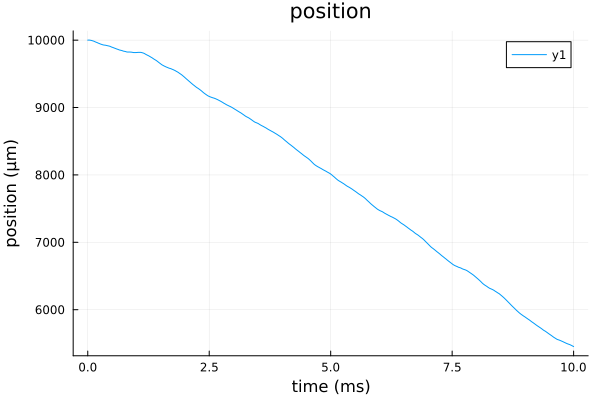

In [214]:
plot_us = sol.u[1:1:end]
plot_ts = sol.t[1:1:end]
plot()
for i in n_states + length(excited_states) + 3:n_states + length(excited_states) + 3
    plot!(plot_ts/Γ*1e3, [real(u[i]) for u in plot_us]./k*1e6)
end
plot!(legend=true, title="position", xlabel="time (ms)",ylabel="position (μm)")

Final temperature = 1.56e-06 K

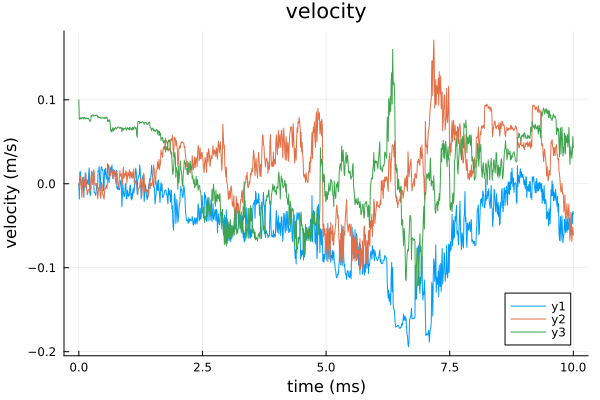

In [168]:
plot_us = sol.u[1:1:end]
plot_ts = sol.t[1:1:end]
plot()
for i in n_states + length(excited_states) + 4:n_states + length(excited_states) + 6
    plot!(plot_ts/Γ*1e3, [real(u[i]) for u in plot_us]./k*Γ)
end
sol_vz = [real(u[n_states + length(excited_states) + 6]) for u in plot_us].*(Γ/k);
v2 = mean(sol_vz[end-length(sol_vz)÷2].^2)
k_B = 1.381e-23
@printf("Final temperature = %.2e K", 1/2*m*v2/k_B)
plot!(legend=true, title="velocity", xlabel="time (ms)",ylabel="velocity (m/s)")

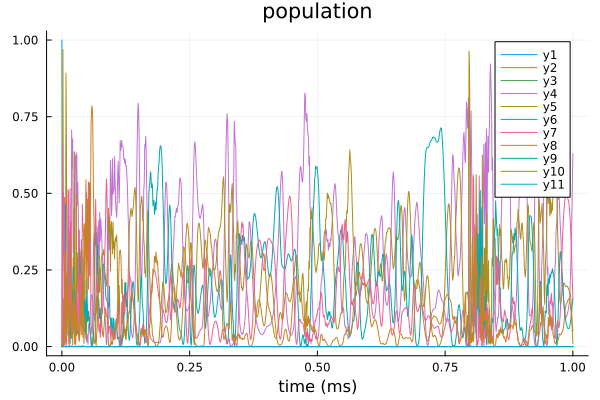

In [171]:

plot()
for i in 1:n_states
    plot!(plot_ts/Γ*1e3, [norm(u[i])^2 for u in plot_us])
end
plot!(legend=true, title="population",xlabel="time (ms)")


In [106]:
n_values = 10
n_threads=Threads.nthreads()
batch_size = fld(n_values, n_threads)
remainder = n_values - batch_size * n_threads
prog_bar = Progress(n_values)
trajectories = []
velocities = []
times = []

particle = OpticalBlochEquations.Particle()
particle.r = (0,0,1e-3).*k
particle.v = (0,0,0)./(Γ/k)
ψ₀ = zeros(ComplexF64, length(H.states))
ψ₀[1] = 1.0
extra_p = MutableNamedTuple(n_excited = length(excited_states))
p = schrödinger(particle, H.states, lasers, d, d, ψ₀, true, m/(ħ*k^2/Γ); 
    extra_p=extra_p, λ=λ, freq_res=1e-2, Zeeman_z = H_Zeeman_z_mat, B_gradient_z=20e2/k);

dT = 0.1
t_span = (0, 10000 *Γ*1e-6) #μs
cb = PeriodicCallback(SE_collapse!, dT, save_positions=(false,false))

prob = ODEProblem(ψ!, p.ψ, t_span, p);

plot(legend=false, title="position", xlabel="time (ms)",ylabel="position (μm)")

Threads.@threads for i ∈ 1:n_threads
    prob_copy = deepcopy(prob)
    cb = PeriodicCallback(SE_collapse!, dT, save_positions=(false,false))
    _batch_size = i <= remainder ? (batch_size + 1) : batch_size
    batch_start_idx = 1 + (i <= remainder ? (i - 1) : remainder) + batch_size * (i-1)
    for j ∈ batch_start_idx:(batch_start_idx + _batch_size - 1) 
        sol = DifferentialEquations.solve(prob_copy, alg=DP5(), reltol=1e-5, abstol = 1e-5, saveat = LinRange(t_span[1],t_span[2],1000), callback=cb, maxiters=100000);
        plot_us = sol.u
        plot_ts = sol.t
        push!(trajectories, [real(u[n_states + length(excited_states) + 3]) for u in plot_us]./k*1e6)
        push!(velocities, [real(u[n_states + length(excited_states) + 6]) for u in plot_us]./k*Γ)
        push!(times, plot_ts./Γ*1e3)
        next!(prog_bar)
    end
end



Progress: 100%|█████████████████████████████████████████| Time: 0:04:59


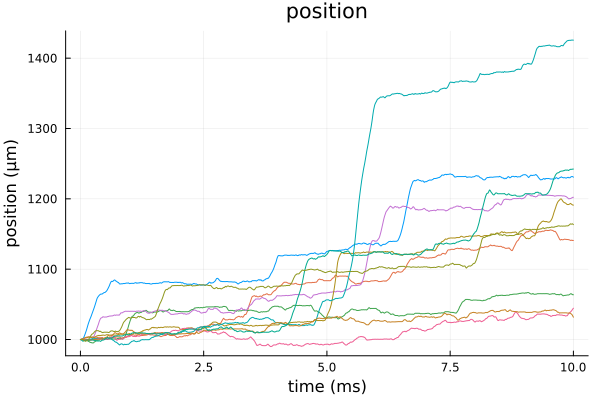

In [107]:
plot(legend=false, title="position", xlabel="time (ms)",ylabel="position (μm)")
for j in 1:length(trajectories)
   plot!(times[j], trajectories[j]) 
end
plot!()

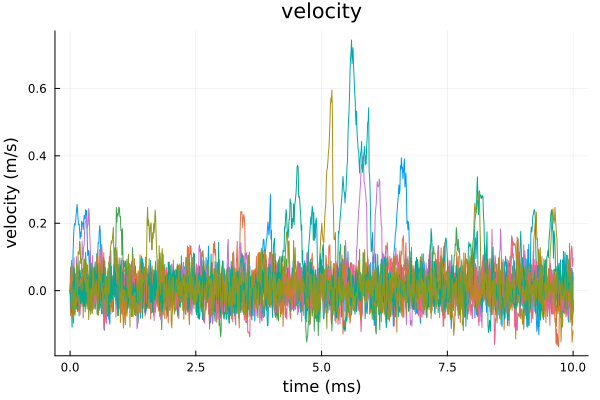

In [108]:
plot(legend=false, title="velocity", xlabel="time (ms)",ylabel="velocity (m/s)")
for j in 1:length(trajectories)
   plot!(times[j], velocities[j]) 
end
plot!()

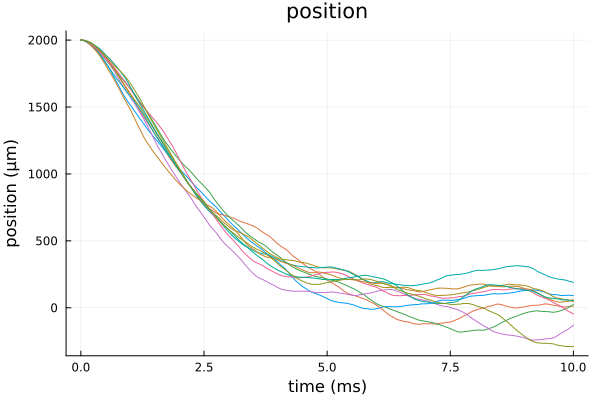

In [45]:
plot(legend=false, title="position", xlabel="time (ms)",ylabel="position (μm)")
for j in 1:length(trajectories)
   plot!(times[j], trajectories[j]) 
end
plot!()

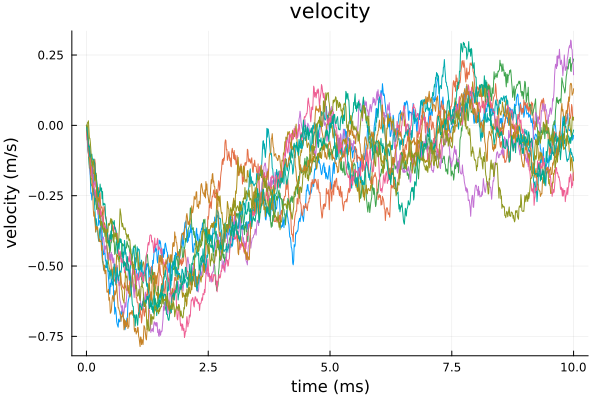

In [49]:
plot(legend=false, title="velocity", xlabel="time (ms)",ylabel="velocity (m/s)")
for j in 1:length(trajectories)
   plot!(times[j], velocities[j]) 
end
plot!()

In [88]:
plot_us = sol.u[1:1000:end]
plot_ts = sol.t[1:1000:end];


# plot()
# for i in n_states + length(excited_states) + 4:n_states + length(excited_states) + 6
#     plot!(plot_ts/Γ*1e3, [real(u[i]) for u in plot_us].*(Γ/k))
# end
# plot!(legend=true, title="velocity",xlabel="time (ms)", ylabel="velocity(m/s)")


In [1]:
sol_vz = [real(u[n_states + length(excited_states) + 6]) for u in plot_us].*(Γ/k);
v2 = mean(sol_vz[end].^2)
k_B = 1.381e-23
@printf("Final temperature = %.2e K", 1/2*m*v2/k_B)

LoadError: UndefVarError: `plot_us` not defined

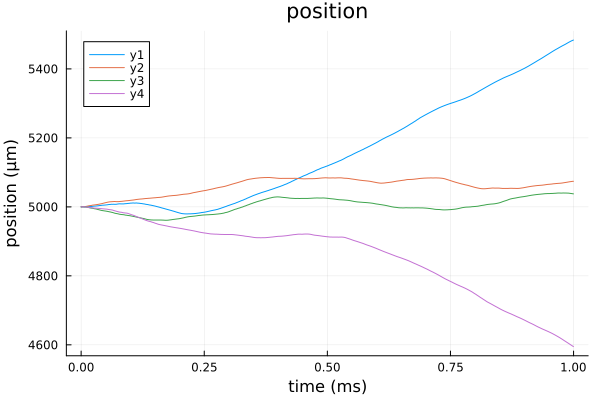

In [90]:
plot_us = sol.u[1:1000:end]
plot_ts = sol.t[1:1000:end]
# plot()
for i in n_states + length(excited_states) + 3:n_states + length(excited_states) + 3
    plot!(plot_ts/Γ*1e3, [real(u[i]) for u in plot_us]./k*1e6)
end
plot!(legend=true, title="position", xlabel="time (ms)",ylabel="position (μm)")

In [401]:
# prob.p.n_scatters

In [268]:
# n_states = length(H.states)
# plot()
# for i in 1:n_states
#     plot!(plot_ts/Γ*1e6, [norm(u[i])^2 for u in plot_us])
# end
# plot!(legend=true)

# for i in n_states + length(excited_states) + 9:n_states +length(excited_states)+ 9
#     plot!(plot_ts/Γ*1e6, [real(u[i]) for u in plot_us], label="force")
# end
# plot!(legend=true,xlabel="time (μs)",ylabel="population")

In [216]:
energy.(H.states)

4-element Vector{Float64}:
 0.0
 1.0e12
 1.0e12
 1.0e12

# Comparison to Monte Carlo simulations with OBE

  4.025756 seconds (6.19 M allocations: 718.537 MiB, 1.67% gc time, 85.57% compilation time)


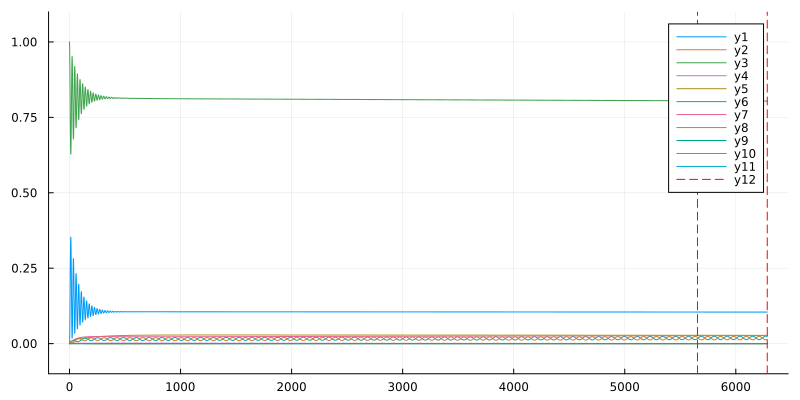

In [172]:
particle = Particle()
ρ0 = zeros(ComplexF64, length(H.states), length(H.states))
ρ0[3,3] = 1.0
freq_res = 1e-2

p = obe(ρ0, particle, H.states, lasers, d, d, true, true, λ, Γ, freq_res, nothing)

t_end = 10p.period
tspan = (0., t_end)
prob = ODEProblem(ρ!, p.ρ0_vec, tspan, p)
callback = PeriodicCallback(reset_force!, prob.p.period)

prob.p.r0 = (0., 0., 0.4) .* 2π
prob.p.v = (0., 0., 0.0)
@time sol = DifferentialEquations.solve(prob, alg=DP5(), reltol=1e-5, abstol = 1e-5, callback=callback)
prob.p.force_last_period .* (ħ * k * Γ / m)*1e-3

using Plots
plot_us = sol.u#[1:10:end]
plot_ts = sol.t#[1:10:end]

n_states = size(p.ρ_soa, 1)
plot(size=(800, 400), ylim=(-0.1, 1.1), legend=nothing)
for i in 1:n_states
    state_idx = n_states*(i-1) + i
    plot!(plot_ts, [real(u[state_idx]) for u in plot_us])
end
plot!(legend=true)
offset = 0
vline!([sol.t[end] - prob.p.period - offset, sol.t[end] - offset], color="red", linestyle=:dash)

In [173]:


function prob_func!(prob, scan_params, i)
    p = prob.p
    
    # Update velocity and position
    p.particle.v .= scan_params[i].v
    p.particle.r0 .= scan_params[i].r
    
    
    # Update magnetic field
    H = p.extra_p.H
    H.parameters.B_z = scan_params[i].B
    evaluate!(H)
    QuantumStates.solve!(H)
    
    # Update transition dipole moments
    update_basis_tdms!(H)
    update_tdms!(H)
    new_d = H.tdms
    
    s = p.extra_p.s
    ω1 = p.extra_p.ω1
    
    k̂ = +x̂; ϵ1 = exp(im*scan_params[i].θx) *rotate_pol(σ⁺, k̂); ϵ_func1 = ϵ_(ϵ1); laser1 = Field(k̂, ϵ_func1, ω1, s)
    k̂ = -x̂; ϵ2 = exp(im*scan_params[i].θx) *rotate_pol(σ⁺, k̂); ϵ_func2 = ϵ_(ϵ2); laser2 = Field(k̂, ϵ_func2, ω1, s)

    k̂ = +ŷ; ϵ3 = exp(im*scan_params[i].θy) * rotate_pol(σ⁺, k̂); ϵ_func3 = ϵ_(ϵ3); laser3 = Field(k̂, ϵ_func3, ω1, s)
    k̂ = -ŷ; ϵ4 = exp(im*scan_params[i].θy) *rotate_pol(σ⁺, k̂); ϵ_func4 = ϵ_(ϵ4); laser4 = Field(k̂, ϵ_func4, ω1, s)

    k̂ = +ẑ; ϵ5 = rotate_pol(σ⁺, k̂);  ϵ_func5 = ϵ_(ϵ5); laser5 = Field(k̂, ϵ_func5, ω1, s)
    k̂ = -ẑ; ϵ6 = rotate_pol(σ⁺, k̂);  ϵ_func6 = ϵ_(ϵ6); laser6 = Field(k̂, ϵ_func6, ω1, s)

    lasers = [laser1, laser2, laser3, laser4, laser5, laser6]
    new_p = obe(p.ρ0, p.particle, H.states, lasers, new_d, nothing, true, true, p.λ, p.Γ, p.freq_res, p.extra_p)
    
    
    return remake(prob, p=new_p)
end

function output_func(p, sol)
    f = p.force_last_period
    return f
end
;

In [174]:
ρ0 = zeros(ComplexF64, length(H.states), length(H.states))
ρ0[3,3] = 1.0

t_end = 10p.period
tspan = (0., t_end)

using RectiGrids

freq_res = 1e-2
extra_p = (H=H, lasers=lasers, ω1 = ω1, s = s)
p = obe(ρ0, particle, H.states, lasers, d, d, true, true, λ, Γ, freq_res, extra_p)

t_end = 10p.period+1; tspan = (0., t_end)
prob = ODEProblem(ρ!, p.ρ0_vec, tspan, p, reltol=1e-3, save_on=false)

di = 5
rs = vcat([(n1*λ/(di+1), n2*λ/(di+1), n3*λ/(di+1)) .* 2π for n1 ∈ 0:di, n2 ∈ 0:di, n3 ∈ 0:di]...)
vzs = LinRange(0,15/(Γ/k),100)
vs = []
for vz in vzs
    push!(vs, [0,0,vz])
end

# vs = [sample_direction(0.0) for _ in 1:1]


scan_values = (B = [0.0], r = rs, v = vs, θx = [0.0], θy = [0.0])
scan_values_grid = RectiGrids.grid(scan_values)

@time forces, populations = force_scan_v2(prob, scan_values_grid, prob_func!, output_func);

averaged_forces = []
averaged_A_populations = []
@time for (i,vz) ∈ enumerate(vzs)
    idxs = [j for (j,x) ∈ enumerate(scan_values_grid) if x.v[3] == vz]
    push!(averaged_forces, mean([f[3] for f in forces[idxs]]))
    push!(averaged_A_populations, mean(populations[idxs, 4:6])*3)
end

Progress: 100%|█████████████████████████████████████████| Time: 0:07:48m


468.891862 seconds (22.51 M allocations: 3.770 GiB, 0.10% gc time, 20.26% compilation time)
  1.588320 seconds (24.08 M allocations: 1.184 GiB, 16.17% gc time, 15.29% compilation time)


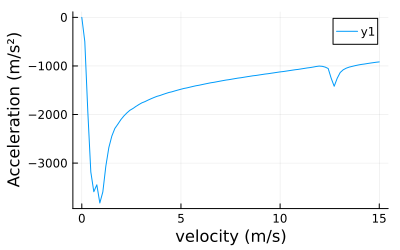

In [175]:
plot(xlabel="velocity (m/s)", ylabel="Acceleration (m/s²)",size=(400,250))
plot!(vzs.*(Γ/k), averaged_forces.* (ħ * k * Γ / m))

In [176]:
# plot(vzs.*(Γ/k), averaged_A_populations,size=(400,250))

In [177]:
include("G:\\My Drive\\github\\BlueDetunedMOTSimulations\\CaOH_simulation_toolbox.jl");
using Interpolations, BeamPropagation
;

In [178]:
scan_values = Dict{String, Vector{Float64}}("B"=>[-1000,1000], "v"=>vzs)
acceleration = zeros(2,length(averaged_forces))
A_populations = zeros(2,length(averaged_forces))

acceleration[1,:] = acceleration[2,:] = averaged_forces.*(ħ * k * Γ / m)
A_populations[1,:] = A_populations[2,:] = averaged_A_populations

acceleration_grids = make_grids(scan_values, acceleration)
A_population_grids = make_grids(scan_values, A_populations)



# Interpolate (in SI units)
B_range = range(scan_values["B"][1],scan_values["B"][end], length=length(scan_values["B"]))
v_range = range(scan_values["v"][1]* (Γ / k),scan_values["v"][end]* (Γ / k), length=length(scan_values["v"]))
        

nodes = (scan_values["B"], scan_values["v"].* (Γ / k))
acceleration_func = interpolate(nodes, acceleration_grids, Gridded(Linear()))
A_population_func = interpolate(nodes, A_population_grids, Gridded(Linear()))     
A_population_func = extrapolate(A_population_func, Flat());


["B", "v"]
["B", "v"]


In [179]:
# y = scan_values["v"].* (Γ / k)
# B_fixed = 1
# plot(xlabel="velocity (m/s)", ylabel="Acceleration (m/s²)",size=(400,250))
# plot!(y, acceleration_func(-100,y) , label=@sprintf("B = %.1f G", B_fixed) )
# plot!()

In [180]:
function update(particles, p, s, dt, time, idx)
    hbar = 1.05457182e-34 
    for i in 1:size(particles, 1)
        B = particles.r[i][3] * p.B_gradient
        v = particles.v[i]
        Pe = p.A_population_func(B * sign(v[3]), abs(v[3]))
        scattering_prob = dt * Γ * Pe
        if rand() < scattering_prob 
            v_rand = sample_direction(hbar * k / m) * 1
            particles.v[i] += SVector(0,0,v_rand[3])
            # if rand() < 0.5
            #     particles.v[i] += sample_direction(hbar * k / m) # SVector(0,0,hbar * k / m)
            # else
            #     particles.v[i] -= SVector(0,0,hbar * k / m)
            # end
        end
    end
    return nothing
end

function init_1D_MOT_distribution(T, diameter)
    kB = 1.381e-23
    m = @with_unit 57 "u"
    σ = sqrt(kB * T / m)
    
    r = (Normal(0, diameter), Normal(0, diameter), Normal(0, diameter))
    v = (Normal(0, σ), Normal(0, σ), Normal(0, σ))
    a = (Normal(0, 0), Normal(0, 0), Normal(0, 0))
    return r, v, a
end


function discard_particles!(particles, discard)
    @inbounds for i in 1:size(particles, 1)
        particles.dead[i] = discard(particles.r[i], particles.v[i])
    end
    StructArrays.foreachfield(x -> deleteat!(x, particles.dead), particles)
    return nothing
end

function discard_out_of_bound(r, v)
    if abs(r[3]) > abs( maximum(scan_values["B"]) / B_gradient )
        return true
    elseif abs(v[3]) > abs( maximum(scan_values["v"])* (Γ / k))
        return true
    else
        return false
    end
end

discard_out_of_bound (generic function with 1 method)

In [181]:
import BeamPropagation.Particle
import StructArrays: StructArray, StructVector
using StructArrays

B_gradient = 0
n = 1000
save_every = 3000
delete_every = 100
dt_min = 1e-10
dt_max = 1e-4
abstol = 1e-5
dt = 1e-8
total_time = @with_unit 5 "ms"
max_steps = Int64(ceil(total_time / dt))
alg = "rkf12"
use_adaptive = false
dt0 = 1e-5
times = (0:dt:max_steps * dt)[1:save_every:end-1]


particles = StructArray{BeamPropagation.Particle}(undef, n)
trajectories = [SVector{3, Float64}[] for _ ∈ 1:length(particles)]
velocities = [SVector{3, Float64}[] for _ ∈ 1:length(particles)]
A_populations = [SVector{1, Float64}[] for _ ∈ 1:length(particles)]

temp = @with_unit 1 "mK"
diameter = @with_unit 0.6 "mm"
r, v, a = init_1D_MOT_distribution(temp, diameter)



p = MutableNamedTuple(B_gradient=B_gradient, acceleration_func=acceleration_func, A_population_func = A_population_func)
mc_s = MutableNamedTuple(trajectories=trajectories, velocities = velocities, A_populations = A_populations)

@time propagate_particles!(r, v, a, 
    alg, particles, f, save, discard_out_of_bound, save_every, delete_every, max_steps, update, p, mc_s, dt, use_adaptive, 
    dt_min, dt_max, abstol, true
)



Progress: 100%|█████████████████████████████████████████| Time: 0:00:0439mProgress:   0%|█                                        |  ETA: 30.02 days


  4.219141 seconds (42.01 M allocations: 726.699 MiB, 367.81% compilation time)


Final temperature = 9.05e-05 K

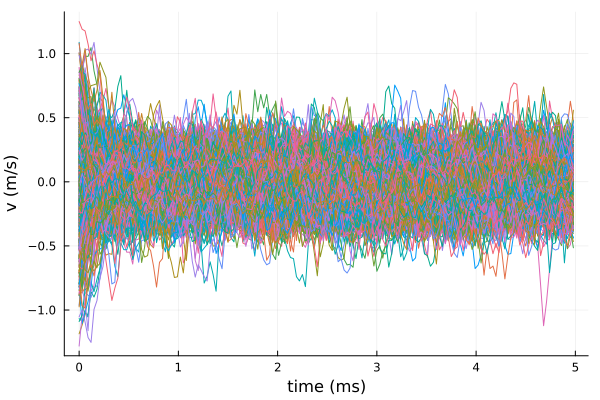

In [182]:
plot(xlabel="time (ms)", ylabel="v (m/s)", legend=false)
for particle_id in 1:1:n
    particle_z_velocity = [mc_s.velocities[particle_id][i][3] for i in  eachindex(mc_s.trajectories[particle_id])]
    plot!(times[1:length(particle_z_velocity)] * 1e3, particle_z_velocity)
end

vs = []
i_half = length(times)÷2
for particle_id in 1:1:n
    push!(vs, mc_s.velocities[particle_id][i_half][3])
end
v = std(vs)

k_B = 1.381e-23
@printf("Final temperature = %.2e K", 1/2*m*v^2/k_B)


plot!()

In [60]:
function add_B_to_A!(A::StructArray{<:Complex}, B::StructArray{<:Complex})
    @turbo for i ∈ eachindex(A)
        A.re[i] = A.re[i] + B.re[i]
        A.im[i] = A.im[i] + B.im[i]
    end
end

function add_B_to_A_with_scalar!(A::StructArray{<:Complex}, B::StructArray{<:Complex}, scalar::Float64)
    @turbo for i ∈ eachindex(A)
        A.re[i] = A.re[i] + scalar * B.re[i]
        A.im[i] = A.im[i] + scalar * B.im[i]
    end
end

add_B_to_A_with_scalar! (generic function with 1 method)

### Copies of some private functions from OpticalBlochEquations package

In [18]:
# Multiplication using `@turbo` from LoopVectorization
function mul_turbo!(C, A, B)
    @turbo for m ∈ 1:size(A,1), n ∈ 1:size(B,2)
        Cmn_re = 0.0
        Cmn_im = 0.0
        for k ∈ 1:size(A,2)
            A_mk_re = A.re[m,k]
            A_mk_im = A.im[m,k]
            B_kn_re = B.re[k,n]
            B_kn_im = B.im[k,n]
            Cmn_re += A_mk_re * B_kn_re - A_mk_im * B_kn_im
            Cmn_im += A_mk_re * B_kn_im + A_mk_im * B_kn_re
        end
        C.re[m,n] = Cmn_re
        C.im[m,n] = Cmn_im
    end
end

function mul_by_im!(C::StructArray{<:Complex})
    @turbo for i ∈ eachindex(C)
        a = C.re[i]
        C.re[i] = -C.im[i]
        C.im[i] = a
    end
end

function mul_by_im_minus!(C::StructArray{<:Complex})
    @turbo for i ∈ eachindex(C)
        a = C.re[i]
        C.re[i] = C.im[i]
        C.im[i] = -a
    end
end

function soa_to_base!(ρ::Array{<:Complex}, ρ_soa::StructArray{<:Complex})
    @inbounds for i in eachindex(ρ_soa)
        ρ[i] = ρ_soa.re[i] + im * ρ_soa.im[i]
    end
    return nothing
end

function base_to_soa!(ρ::Array{<:Complex}, ρ_soa::StructArray{<:Complex})
    @inbounds for i in eachindex(ρ_soa)
        ρ_soa.re[i] = real(ρ[i])
        ρ_soa.im[i] = imag(ρ[i])
    end
    return nothing
end

function base_to_soa_vec!(ρ::Array{<:Complex}, ρ_soa::StructArray{<:Complex})
    @inbounds for i in eachindex(ρ, ρ_soa)
        ρ_soa.re[i] = real(ρ[i])
        ρ_soa.im[i] = imag(ρ[i])
    end
    return nothing
end

function update_eiωt!(eiωt::StructArray{<:Complex}, ω::Array{<:Real}, τ::Real)
    @turbo for i ∈ eachindex(ω)
        eiωt.im[i], eiωt.re[i] = sincos( ω[i] * τ )
    end
    return nothing
end



update_eiωt! (generic function with 1 method)

In [25]:
import OpticalBlochEquations.update_H!

function update_H(H, p, τ)
    @turbo for i in eachindex(H)
        H.re[i] = p.H₀.re[i]
        H.im[i] = p.H₀.im[i]
    end
    return nothing
end

function update_H!(p, τ, r, H₀, fields, H, E_k, ds, ds_state1, ds_state2, Js)

    p.update_H(H, p, τ)
    
    # @turbo for i in eachindex(H)
    #     H.re[i] = H₀.re[i]
    #     H.im[i] = H₀.im[i]
    # end
 
    update_fields!(fields, r, τ)

    # Set summed fields to zero
    p.E -= p.E
    @inbounds for i ∈ 1:3
        E_k[i] -= E_k[i]
    end
    
    # Sum updated fields
    @inbounds for i ∈ eachindex(fields)
        E_i = fields.E[i] * sqrt(fields.s[i]) / (2 * √2)
        k_i = fields.k[i]
        p.E += E_i
        for k ∈ 1:3
            E_k[k] += E_i * k_i[k]
        end
    end

    # This can be used to exclude very off-resonant terms, need to add a user-defined setting to determine behavior
    # @inbounds for i ∈ eachindex(fields)
    #     s = fields.s[i]
    #     ω_field = fields.ω[i]
    #     x = sqrt(s) / (2 * √2)
    #     @inbounds for q ∈ 1:3
    #         E_i_q = fields.E[i][q]
    #         if norm(E_i_q) > 1e-10
    #             d_nnz_q = d_nnz[q]
    #             d_q = @view d[:,:,q]
    #             @inbounds @simd for cart_idx ∈ d_nnz_q
    #                 m, n = cart_idx.I
    #                 if abs(ω_field - (ω[n] - ω[m])) < 100 # Do not include very off-resonant terms (terms detuned by >10Γ)
    #                     val = x * E_i_q * d_q[m,n]
    #                     H[m,n] += val
    #                     H[n,m] += conj(val)
    #                 end
    #             end
    #         end
    #     end
    # end

    @inbounds for q ∈ 1:3
        E_q = p.E[q]
        if norm(E_q) > 1e-10
            E_q_re = real(E_q)
            E_q_im = imag(E_q)
            ds_q = ds[q]
            ds_q_re = ds_q.re
            ds_q_im = ds_q.im
            ds_state1_q = ds_state1[q]
            ds_state2_q = ds_state2[q]
            @turbo for i ∈ eachindex(ds_q)
                m = ds_state1_q[i] # excited state
                n = ds_state2_q[i] # ground state
                d_re = ds_q_re[i]
                d_im = ds_q_im[i]
                val_re = E_q_re * d_re - E_q_im * d_im
                val_im = E_q_re * d_im + E_q_im * d_re
                H.re[n,m] += val_re
                H.im[n,m] += val_im
                H.re[m,n] += val_re
                H.im[m,n] -= val_im
            end
        end
    end

    # Is this version faster?
    # @inbounds for q ∈ 1:3
    #     E_q = p.E[q]
    #     if norm(E_q) > 1e-10
    #         d_nnz_q = d_nnz[q]
    #         d_q = @view d[:,:,q]
    #         @inbounds @simd for cart_idx ∈ d_nnz_q
    #             m, n = cart_idx.I
    #             val = E_q * d_q[m,n]
    #             H[m,n] += val
    #             H[n,m] += conj(val)
    #         end
    #     end
    # end

    for J ∈ Js
        rate = im * J.r^2 / 2
        H[J.s, J.s] -= rate
    end

    return nothing
end

round_to_mult(val, prec) = round.(val ./ prec) .* prec

function round_freq(ω, freq_res)
    ω_min = freq_res
    return round_to_mult(ω, ω_min)
end
export round_freq



function round_v_by_norm(v, digits)
    v_norm = norm(v)
    return v ./ (v_norm / round(v_norm, digits=digits))
end

function round_freqs!(states, fields, freq_res)
    """
    Rounds frequencies of state energies and fields by a common denominator.
    
    freq_res::Float: all frequencies are rounded by this value (in units of Γ)
    """
    for i in eachindex(fields)
        fields.ω[i] = round_freq(fields.ω[i], freq_res)
    end
    for i in eachindex(states)
        states.E[i] = round_freq(states.E[i], freq_res)
    end
    return nothing
end


round_freqs! (generic function with 1 method)